# Week 8

## Part 1: More on narrative data viz

**What's the point of Figure 7?**

Is illustrates a lack of certain design elementes when presenting data to a user across a number of visualizations from a range of sources. Specifically the 'story' which the user is being told. 

The ordering of the narrative structure is often 'User Directed' or 'Random Access' rather than 'Linear', meaning the user has to navigate themselves or are fed the in an arbitrary order.

As for Interactivity, Tacit Tutorial and Simulating Default Views is also very under-utilized.

Lastly, almost all types of messaging is lacking for most of the visualizations covered.


**Use Figure 7 to find the most common design choice within each category for the Visual narrative and Narrative structure (the categories within visual narrative are 'visual structuring', 'highlighting', etc).**

The most common Visual Structuring is Consistent Visual Platform.

The most common Hightlighting is Feature Distinction.

The most common Transition Guidance is Object Continuity


**Check out Figure 8 and section 4.3. What is your favorite genre of narrative visualization? Why? What is your least favorite genre? Why?**

<u> Favorite Genre: Partitioned Poster </u><br />
Due to the amount of information that can be communicated at once. It gives a good overview of what the data is telling without going in to too much detail. Some ordering is possible, but you don't need to read the entire thing to get an idea of what's going on.

<u> Least Favorite Genre: Slide Show </u><br />
Requires too much effort from the user and is difficult backtrack information if you're not focusing on it 100%. I would much rather have all the information on a single page. It does provide at good ordering of the content, however this can be achieved in many better ways, such as flow chart or comic strip.

## Part 2: A short data story / micro-project

**Find your own story to tell in the work on analyzing the SF Crime Data**
  
Tasks
- Format must be **Magazine Genre**
- Single page
- Hosted on github page
- Include 3 visualizations
  - One time-series (week 2 part 4)
    - May be repetition
  - One map (week 3 and 4)
    - May be repetition
  - One interactive using Bokeh
    - Different data than exercise week 6 at leat
- Visual consistency (color, fonts)
- 500-1500 words
  

### Data exploration for a story

**Story 2**

In recent years, organized car theft rings has emerged, causing an increase in car thefts around SF.

- **Time-series**: Car theft increased more compared to other crimes
- **Map**: Where have car theft increased the most? Maybe a map a time range?
- **Bookeh**: Compare increase in car theft with increase in other types of crime

Car theft can be substituted with anything

In [1]:
import pandas as pd
import numpy as np
import polars as pl

import matplotlib.pyplot as plt

from bokeh.plotting import figure, show
from bokeh.io import output_notebook

output_notebook()

from bokeh.models import ColumnDataSource, Legend
from bokeh.plotting import save
from bokeh.io import export_png, export_svg



import warnings
warnings.filterwarnings('ignore')

# Choose style from stylesheet
plt.style.use('fivethirtyeight')

# where to save plots for updating github-page
GITHUB_PAGE_PATH = r"C:\Users\hcm\OneDrive - NORDEN\Documents\Projects\social_data\fimselamse.github.io\assets\\"
DATA_PATH = r"C:\Users\hcm\OneDrive - NORDEN\Documents\Projects\social_data\assignments\Police_Department_Incident_Reports__Historical_2003_to_May_2018.csv"

FOCUS_CRIME = 'LARCENY/THEFT'

# limit types of crime
focus_crimes = ['WEAPON LAWS', 'PROSTITUTION', 'ROBBERY', 'BURGLARY', 'ASSAULT', 'DRUNKENNESS',
                      'DRUG/NARCOTIC', 'TRESPASS', 'LARCENY/THEFT', 'VANDALISM', 'VEHICLE THEFT', 'STOLEN PROPERTY', 'DISORDERLY CONDUCT']


Loading BokehJS ...

In [2]:
# function for prepping data for analysis (mainly limiting size)

def prep_data(data):
    # use focuscrimes from exercises
    data = data.loc[data.Category.isin(focus_crimes)]

    # fix datatypes
    data['IncidntNum'] = pd.to_numeric(data['IncidntNum'], downcast='integer')
    data['Incident Code'] = data['Incident Code'].astype('category')
    data['Category'] = data['Category'].astype('category')
    data['DayOfWeek'] = pd.Categorical(data['DayOfWeek'], categories=[
                                       'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'], ordered=True)
    data['DateTime'] = pd.to_datetime(
        data['Date'] + ' ' + data['Time'], format="%m/%d/%Y %H:%M")
    data['PdDistrict'] = data['PdDistrict'].astype('category')
    data['X'] = pd.to_numeric(data['X'], downcast='float')
    data['Y'] = pd.to_numeric(data['Y'], downcast='float')

    # drop redundant cols
    data = data.drop(columns=['Date', 'Time'])

    # filter by relevant data
    # data is incomplete for year 2018 and fuzzy before 2007
    data = data.loc[(data['DateTime'].dt.year > 2006) &
                    (data['DateTime'].dt.year < 2018)]

    return data


# cols to retrieve
cols = ['PdId', 'IncidntNum', 'Incident Code',
        'Category', 'DayOfWeek', 'Date', 'Time', 'PdDistrict', 'X', 'Y']

# Load data
data = pd.read_csv(DATA_PATH, usecols=cols)

data = prep_data(data)

**Time-series**

A little exploration

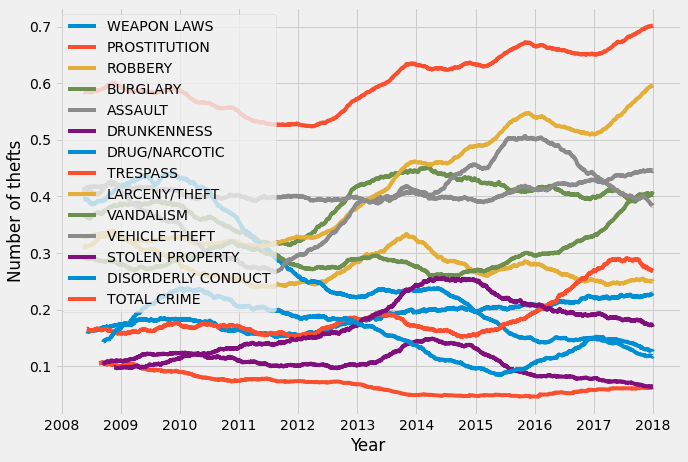

In [3]:
window_size = 500
fig, ax = plt.subplots(figsize=(10, 7))

for focus_crime in focus_crimes:
    # general theft
    focus = data.loc[data.Category == focus_crime]
    # data before 2006 contains some flaws
    focus_crime_by_day = focus.groupby(focus.DateTime.dt.date).agg(count=('PdId','count'))
    focus_crime_by_day['count'] = (focus_crime_by_day['count']-focus_crime_by_day['count'].min())/(focus_crime_by_day['count'].max()-focus_crime_by_day['count'].min())

    focus_crime_by_day_smooth = focus_crime_by_day.rolling(window_size).mean()

    ax.plot(focus_crime_by_day_smooth, label=focus_crime)

#  # Calculate total crimerate
total_crime_by_day = data.groupby(data.DateTime.dt.date).agg(count=('PdId','count'))
total_crime_by_day['count'] = (total_crime_by_day['count']-total_crime_by_day['count'].min())/(total_crime_by_day['count'].max()-total_crime_by_day['count'].min())
total_crime_by_day_smooth = total_crime_by_day.rolling(window_size).mean()
ax.plot(total_crime_by_day_smooth, label='TOTAL CRIME')

ax.set_xlabel('Year')
ax.set_ylabel('Number of thefts')
ax.legend()
plt.show()

In [8]:
p = figure(width=740, height=500, toolbar_location=None, x_axis_type="datetime") 

# Do a little prettifying
p.title.text = 'Timeseries of Thefts in San Francisco'
p.title.align = 'center'
p.xaxis.axis_label = 'Year'
p.yaxis.axis_label = 'Number of thefts'
p.xgrid.grid_line_color = None
# p.background_fill_color = None
# p.border_fill_color = None

color_code = "#bcbd22"

# create time-series for each focus crim
focus = data.loc[data.Category == FOCUS_CRIME]
focus_crime_by_day = focus.groupby(focus.DateTime.dt.date).agg(count=('PdId','count')).reset_index()
focus_crime_by_day['count'] = focus_crime_by_day['count'].rolling(500).mean()
focus_crime_by_day = focus_crime_by_day.dropna()

source = ColumnDataSource(focus_crime_by_day)

# plot
p.line(x='DateTime', y='count', source=source, line_width=4, legend_label=FOCUS_CRIME, color=color_code)

# remove original legend
p.legend.visible=False 

show(p)

export_png(p, filename=GITHUB_PAGE_PATH  + 'time-series.png')

'C:\\Users\\hcm\\OneDrive - NORDEN\\Documents\\Projects\\social_data\\fimselamse.github.io\\assets\\time-series.png'

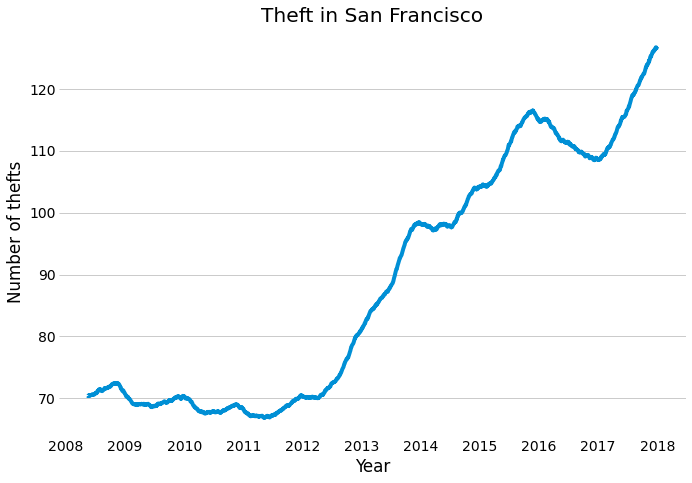

In [ ]:
window_size = 500

fig, ax = plt.subplots(figsize=(10, 7))
fig.set_facecolor('white')

# Prettify
ax.set_xlabel('Year')
ax.set_ylabel('Number of thefts')
ax.set_title('Theft in San Francisco')
ax.grid(False, axis='x')
ax.set_facecolor('white')
for spine in ax.spines.values():
    spine.set_visible(False)

# Do a little data manipulation
focus = data.loc[data.Category == FOCUS_CRIME]
focus_crime_by_day = focus.groupby(
    focus.DateTime.dt.date).agg(count=('PdId', 'count'))
focus_crime_by_day_smooth = focus_crime_by_day.rolling(window_size).mean()

ax.plot(focus_crime_by_day_smooth, label=FOCUS_CRIME)



plt.savefig(GITHUB_PAGE_PATH + "\\" +'time-series.png')

In [ ]:
import plotly.express as px
import json
from urllib.request import urlopen

# load data
with urlopen('https://raw.githubusercontent.com/suneman/socialdata2022/main/files/sfpd.geojson') as response:
    counties = json.load(response)

### Map

In [ ]:
from folium.plugins import HeatMap, HeatMapWithTime
import folium

# define coordinates for SF
sf_coord = {"lat": 37.760000 , "lon": -122.431297}

focus['Hour'] = focus.DateTime.dt.hour
hours = np.sort(focus.Hour.unique())

heat_data = focus.groupby(['Y','X','Hour']).agg(weight=('PdId','count')).reset_index()
heat_data['weight'] /= max(heat_data.weight)
heat_data = [[[row['Y'],row['X'], row['weight']] for index, row in heat_data[heat_data['Hour'] == i].iterrows()] for i in hours]

In [ ]:
# Add heat to map
sf_map = folium.Map([sf_coord['lat'], sf_coord['lon']], zoom_start=12)
# HeatMap(heat_data, radius=15, blur=25).add_to(sf_map)
HeatMapWithTime(heat_data, auto_play=True, 
                min_opacity = 0.1,
                max_opacity = 0.9,
                radius=25,
                blur=0.9,
                use_local_extrema=False).add_to(sf_map)
# display map
sf_map  

In [ ]:
sf_map.save(GITHUB_PAGE_PATH + 'folium2.html')

### Interactive plot

Compare increase in crime rate across different types of crime

In [9]:
p = figure(width=740, height=500, toolbar_location=None, x_axis_type="datetime") 

# Do a little prettifying
p.title.text = 'Development in Crime Frequency'
p.title.align = 'center'
p.xaxis.axis_label = 'Year'
p.yaxis.axis_label = 'Crime Rate'
p.xgrid.grid_line_color = None

color_codes = [
    "#1f77b4",
    "#ff7f0e",
    "#2ca02c",
    "#d62728",
    "#9467bd",
    "#8c564b",
    "#e377c2",
    "#7f7f7f",
    "#bcbd22",
    "#17becf",
    "#aec7e8",
    "#ffbb78",
    "#98df8a",
    "#ff9896"
]

# list for legend
legend_it = []
d = {}

for idx, focus_crime in enumerate(focus_crimes):
    # create time-series for each focus crim
    focus = data.loc[data.Category == focus_crime]
    focus_crime_by_day = focus.groupby(focus.DateTime.dt.date).agg(count=('PdId','count')).reset_index()
    focus_crime_by_day['count'] = (focus_crime_by_day['count']-focus_crime_by_day['count'].min())/(focus_crime_by_day['count'].max()-focus_crime_by_day['count'].min())

    focus_crime_by_day['count'] = focus_crime_by_day['count'].rolling(500).mean()
    focus_crime_by_day = focus_crime_by_day.dropna()

    source = ColumnDataSource(focus_crime_by_day)

    # plot
    c = p.line(x='DateTime', y='count', source=source, line_width=3, muted_alpha = 0, muted = True, legend_label=focus_crime, color=color_codes[idx])

    # add line to list
    d[focus_crime] = c
    legend_it.append((focus_crime, [c]))

# remove original legend
p.legend.visible=False 

# add chad legend
legend = Legend(items=legend_it)
legend.click_policy="mute"
p.add_layout(legend, 'right')

# unmute something for presentation
d['LARCENY/THEFT'].muted = False
d['VANDALISM'].muted = False

show(p)

save(p, GITHUB_PAGE_PATH  + 'bokeh.html')

'C:\\Users\\hcm\\OneDrive - NORDEN\\Documents\\Projects\\social_data\\fimselamse.github.io\\assets\\bokeh.html'